(240, 240, 4)
one image [0. 0. 0. 0.]


C:\Users\user\AppData\Local\Temp\ipykernel_44000\7271826.py:41: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1,3, figsize=(20,2))#no_slices, 4,


<Figure size 640x480 with 0 Axes>

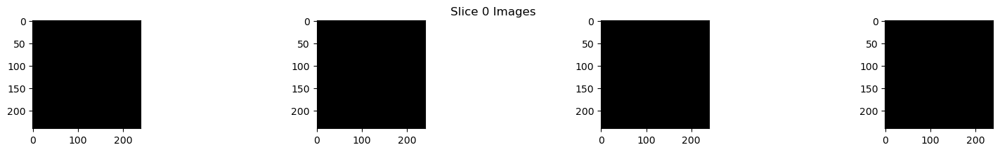

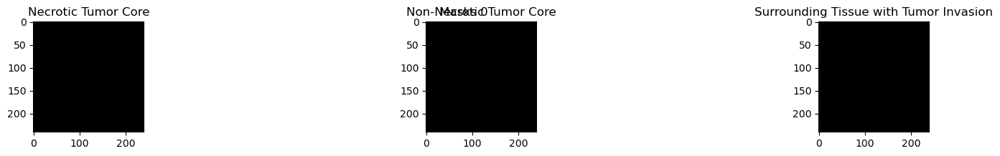

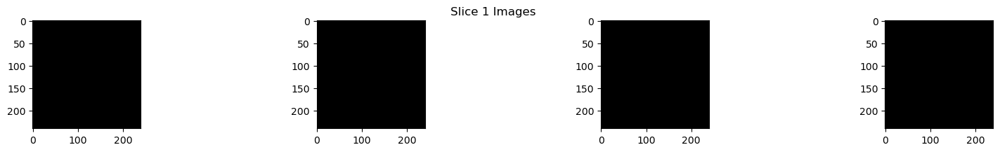

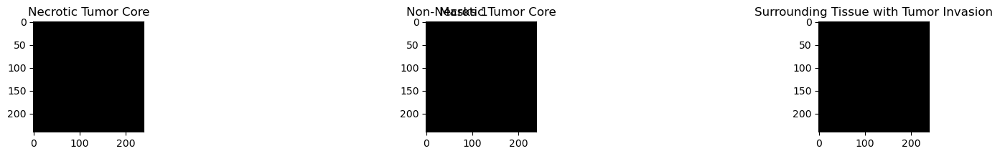

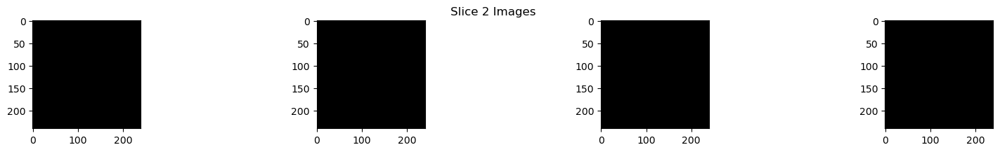

...

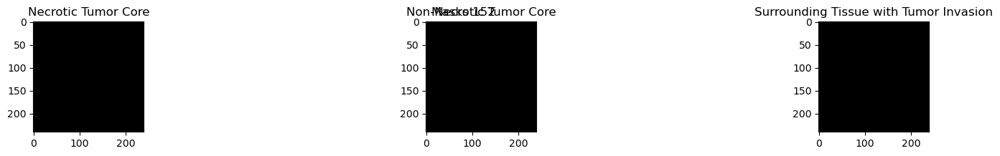

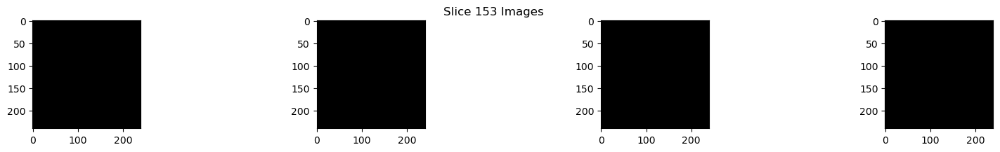

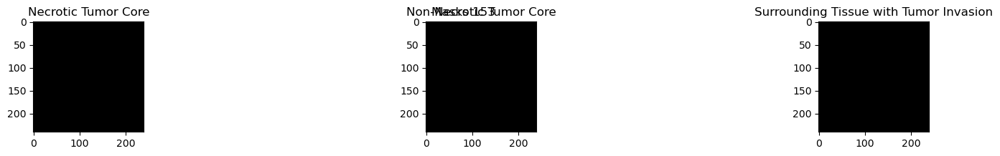

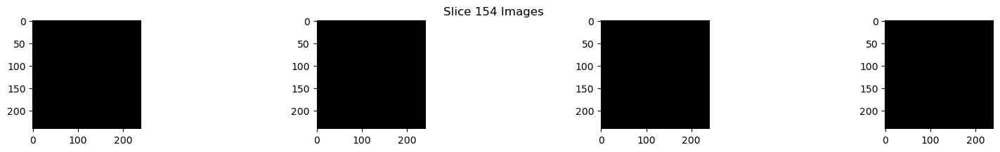

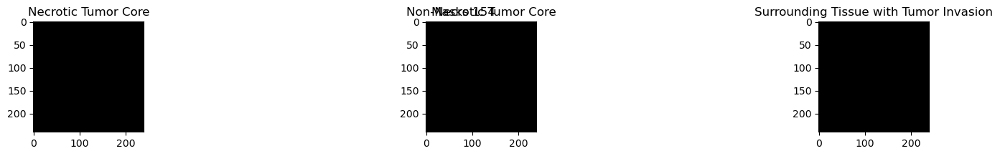

In [1]:
import tkinter as tk
import tkinter.ttk
from tkinter import filedialog
from PIL import ImageTk, Image
import numpy as np
import cv2

import matplotlib.pyplot as plt
import pandas as pd
import tables as tb

no_slices = 155


glioma_masks =  tb.open_file(r"C:\Users\user\Documents\UWA\Honours in Computer Science and Software Engineering\CITS4402 - Computer Vision\Project\archive\BraTS2020_training_data\content\data\volume_1_slice_0.h5", mode="r").root.mask.read()
glioma_images =  tb.open_file(r"C:\Users\user\Documents\UWA\Honours in Computer Science and Software Engineering\CITS4402 - Computer Vision\Project\archive\BraTS2020_training_data\content\data\volume_1_slice_0.h5", mode="r").root.image.read()

print(glioma_images.shape)
glioma_slices_masks= glioma_masks[np.newaxis,:]
glioma_slices_images= glioma_images[np.newaxis,:]

for slice in range(1,no_slices):
    
    next_glioma_mask =  tb.open_file(r"C:\Users\user\Documents\UWA\Honours in Computer Science and Software Engineering\CITS4402 - Computer Vision\Project\archive\BraTS2020_training_data\content\data\volume_1_slice_"+str(slice)+".h5", mode="r").root.mask.read()
    next_glioma_image =  tb.open_file(r"C:\Users\user\Documents\UWA\Honours in Computer Science and Software Engineering\CITS4402 - Computer Vision\Project\archive\BraTS2020_training_data\content\data\volume_1_slice_"+str(slice)+".h5", mode="r").root.image.read()
    
    glioma_slices_masks = np.vstack((glioma_slices_masks,next_glioma_mask[np.newaxis,:]))
    glioma_slices_images = np.vstack((glioma_slices_images,next_glioma_image[np.newaxis,:]))

print("one image",glioma_images[0,0])
#fig, ax = plt.subplots(10,4, figsize=(20,2))#no_slices, 4,
#print("image shape",glioma_slices_images[slice,:,:,image].shape)
mask_titles=["Necrotic Tumor Core","Non-Necrotic Tumor Core","Surrounding Tissue with Tumor Invasion"]

plt.subplots_adjust(wspace=0.5, hspace=0.2)
for slice in range(no_slices): #glioma_slices_images.shape[0]
    fig, ax = plt.subplots(1,4, figsize=(20,2))#no_slices, 4,
    fig.suptitle("Slice "+ str(slice) + " Images " )
    for image in range(glioma_slices_images.shape[3]):
        ax[image].imshow(glioma_slices_images[slice,:,:,image],cmap="gray")
    fig, ax = plt.subplots(1,3, figsize=(20,2))#no_slices, 4,
    fig.suptitle("Masks " + str(slice))
    for image in range(glioma_slices_masks.shape[3]):
        ax[image].set_title(mask_titles[image])
        ax[image].imshow(glioma_slices_masks[slice,:,:,image],cmap="gray")
    
plt.show()

    


In [2]:
print("image shape",glioma_slices_images[slice,:,:,image].shape)
print("image shape",type(glioma_slices_images[slice,:,:,image]))
print("image shape",repr(glioma_slices_images[slice,:,:,image]))

image shape (240, 240)
image shape <class 'numpy.ndarray'>
image shape array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])


### To merge three image

blend the first two images with 50 % weight into one image
then blend that image with the third giving 2/3 weight to the forst blended image and
1/3 weight to the third image. Thereby gioving them an equal contribution

(240, 240, 3)


<function matplotlib.pyplot.show(close=None, block=None)>

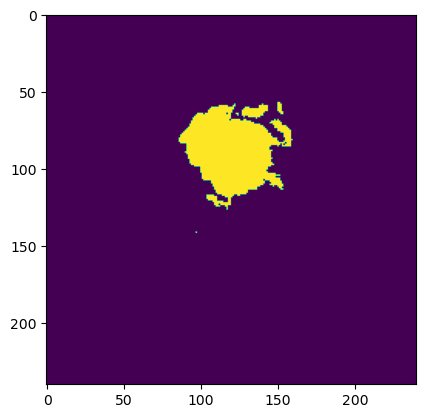

In [20]:
def merge_masks(mask_array):
    merge_one = cv2.addWeighted(mask_array[:,:,0],0.51,mask_array[:,:,1],0.51, 0)
    merge_two = cv2.addWeighted(merge_one,0.51,mask_array[:,:,2],0.51, 0.0, dtype=-1)
    return merge_two
slice = 54
print(glioma_slices_masks[slice,:,:,:].shape)
plt.imshow(merge_masks(glioma_slices_masks[slice,:,:,:]))#cmap="gray"
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

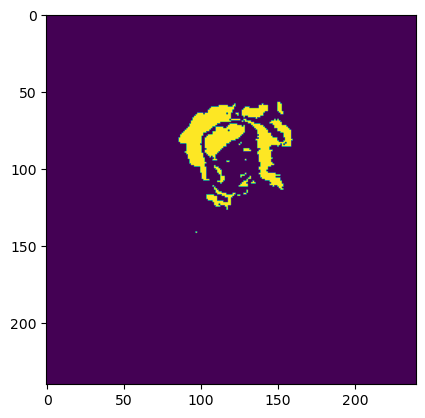

In [13]:
a=glioma_slices_masks[slice,:,:,:]
b=a[:,:,0]
cv2.addWeighted(a[:,:,0],0.5,a[:,:,1],0.5, 0)#,dtype=-1
plt.imshow(cv2.addWeighted(a[:,:,0],0.501,a[:,:,1],0.501, 0))
plt.show

In [27]:
class Glioma_classification:
    # Class constructor, initialiase and instance of the class
    def __init__(self, tktr):
        self.tktr=tktr
        self.tktr.title("Glioma Classifier") 
        self.slidercontroller=tk.IntVar()
        self.button_press = False
        self.lowerthreshold_ulimit = 0
        
        # Create the frame for the GUI and center the frame for the GUI
        self.frame = tk.Frame(self.tktr, width= 200, height =500)
        self.frame.pack(expand=True, padx=10, pady=100)
        self.frame.grid_rowconfigure(0, weight=1)
        self.frame.grid_columnconfigure(0, weight=1)
 
        # Create a border for the GUI and palce it in the frame
        self.border = tk.Frame(self.frame, borderwidth=2, relief="groove")
        self.border.grid(row=0, column=0, sticky="nsew")
        self.border.config(bg="#776871")
        
        # Create a "Load Image" button for the user to load a slice from a volume
        self.load_button = tk.Button(self.border, text="Load Image", command=self.load_image,bg="#AFDEDC")
        self.load_button.grid(row=200,column=50)

        # Create a dropdown menu widget for the user to select MRI Volume Channel
        self.menu_label_holder = tk.StringVar(self.border,"T1")
        self.dropmenu= tk.OptionMenu(self.border,self.menu_label_holder,*["T2-Flair","Native (T1)", "T1 Weigheted (T1Gd)", "T2-Weighted"])
        self.dropmenu.config(bg="#F0F7EE")
        self.dropmenu.grid(row=220,column=100,padx=5,pady=5)

        # Create a dropdown menu widget for the user to select MRI Volume Channel
        self.menu_label_holder = tk.StringVar(self.border,"Off")
        self.dropmenu= tk.OptionMenu(self.border,self.menu_label_holder,*["On", "Off"])
        self.dropmenu.config(bg="#F0F7EE")
        self.dropmenu.grid(row=220,column=100,padx=5,pady=5)
        
        # Create a tkinter label widget to display the loaded image
        self.image_label = tk.Label(self.border)
        self.image_label.config(bg="#AFDEDC")
        self.image_label.grid(row=5,column=50)
        
        # Create a Scale/slider widget to enable to user specify the slice from the selected volume
        self.slice_number = tk.IntVar()
        self.slice_viewed = tk.Scale(self.border, from_=0, to=155,orient=tk.HORIZONTAL, length=300,resolution=1,label="Slice Number", variable=self.slice_number, command=self.slice_viewer)
        self.slice_viewed.config(bg="#DAE7F0")
        self.slice_viewed.grid(row=200,column=100, padx=5,pady=5)
        
        

    def load_image(self):
        # Open a file selection dialog box enabling the user to choose an image file
        file_path = filedialog.askopenfilename(title="Select Image File", filetypes=[("Slices", "*.h5")])
        
        # Load the chosen image into the current object
        # Exception: Attribute error if loading no image. Print a request to load an image
        try:
            self.original_image = Image.open(file_path)
        except AttributeError:
            print("You have not selected an image, try choosing on from one of the files in the open window ")
            return
        
        # Resize the image to fit in the image_label label
        width, height = self.original_image.size
        max_size = 300
        if width > height:
            new_width = max_size
            new_height = int(height * (max_size / width))
        else:
            new_width = int(width * (max_size / height))
            new_height = max_size
        self.original_image = self.original_image.resize((new_width, new_height))
        
        # Convert the image to Tkinter format and display it on the left side of the GUI
        photo = ImageTk.PhotoImage(self.original_image)
        self.image_label.configure(image=photo)
        self.image_label.image = photo
        self.to_save=photo

    def slice_viewer(self):
        view_slice=self.slice_number
        pass

if __name__ == "__main__":
    root = tk.Tk()
    gui = Glioma_classification(root)
    root.mainloop()

Exception in Tkinter callback
Traceback (most recent call last):
  File "C:\Users\user\miniconda3\envs\cits4402-2024v2\lib\tkinter\__init__.py", line 1892, in __call__
    return self.func(*args)
TypeError: slice_viewer() takes 1 positional argument but 2 were given
Exception in Tkinter callback
Traceback (most recent call last):
  File "C:\Users\user\miniconda3\envs\cits4402-2024v2\lib\tkinter\__init__.py", line 1892, in __call__
    return self.func(*args)
TypeError: slice_viewer() takes 1 positional argument but 2 were given
Exception in Tkinter callback
Traceback (most recent call last):
  File "C:\Users\user\miniconda3\envs\cits4402-2024v2\lib\tkinter\__init__.py", line 1892, in __call__
    return self.func(*args)
TypeError: slice_viewer() takes 1 positional argument but 2 were given
Exception in Tkinter callback
Traceback (most recent call last):
  File "C:\Users\user\miniconda3\envs\cits4402-2024v2\lib\tkinter\__init__.py", line 1892, in __call__
    return self.func(*args)
Typ

You have not selected an image, try choosing on from one of the files in the open window 
